# ============================================================
# CSE 475 - Assignment: Weeds Object Detection
# Notebook 2 of 3 — **YOLOv11n**
# ============================================================

### Group: 02
1. **Osama Bin Qashem** (2022-2-60-058)  
2. **Saif Khan** (2022-2-60-063)  
3. **Mahmudul Hasan Hamim** (2022-2-60-079)  
4. **Nusrat Jahan Oishi** (2022-2-60-033)

---

## Institution
**East West University**  
Department of Computer Science and Engineering  

Course Code: **CSE 475** | Section: **03**  
Instructor: **Dr. Md. Rifat Ahmmad Rashid**  

**Model Focus (this notebook): YOLOv11n**

---

## What this notebook does
- Builds a clean `weeds.yaml` pointing to Kaggle dataset splits
- Trains **YOLOv11n**
- Evaluates on **test** split (mAP, Precision, Recall, F1)
- Produces **Explainability Grid**:
  **Columns:** Original | ScoreCAM | EigenCAM | Prediction  
  **Rows:** Model names vertically (YOLOv11n + any other available weights)

# 0) Setup

In [1]:
# ============================================================
# Install minimal dependencies
# ============================================================
!pip install -q ultralytics --no-deps
!pip install -q ttach

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.3 MB/s eta 0:00:00


In [2]:
# ============================================================
# Imports + global config
# ============================================================
import os
import random
from pathlib import Path

import cv2
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from ultralytics import YOLO

# Plot defaults
plt.rcParams["figure.figsize"] = (8, 8)
plt.rcParams["axes.grid"] = False

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Kaggle dataset paths
DATA_ROOT = Path("/kaggle/input/weeds-dataset")
RAW_DATA_YAML = DATA_ROOT / "data.yaml"
WORK_YAML = Path("/kaggle/working/weeds.yaml")

# Train config (YOLOv11)
MODEL_ID = "yolo11n.pt"
MODEL_NAME = "YOLOv11n"

EPOCHS = 100
BATCH_SIZE = 16
IMAGE_SIZE = 640
PATIENCE = 15
DEVICE = 0  # change to "cpu" if needed

print("DATA_ROOT:", DATA_ROOT)
print("RAW_DATA_YAML:", RAW_DATA_YAML)
print("WORK_YAML:", WORK_YAML)
print("MODEL:", MODEL_ID)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
DATA_ROOT: /kaggle/input/weeds-dataset
RAW_DATA_YAML: /kaggle/input/weeds-dataset/data.yaml
WORK_YAML: /kaggle/working/weeds.yaml
MODEL: yolo11n.pt


# 1) Dataset Setup (weeds.yaml + quick samples)

In [3]:
# ============================================================
# Create weeds.yaml (robust: reads Roboflow names/nc if available)
# ============================================================
IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

def make_work_yaml(data_root: Path, raw_yaml: Path, out_yaml: Path):
    names = ["Weeds"]
    nc = 1

    if raw_yaml.exists():
        try:
            raw = yaml.safe_load(raw_yaml.read_text())
            if isinstance(raw, dict):
                if "names" in raw and raw["names"]:
                    names = raw["names"] if isinstance(raw["names"], list) else list(raw["names"])
                if "nc" in raw:
                    nc = int(raw["nc"])
        except Exception as e:
            print("[WARN] Could not parse data.yaml:", e)

    data_yaml = {
        "train": str((data_root / "train" / "images").resolve()).replace("\\", "/"),
        "val":   str((data_root / "valid" / "images").resolve()).replace("\\", "/"),
        "test":  str((data_root / "test" / "images").resolve()).replace("\\", "/"),
        "nc": nc,
        "names": names,
    }
    out_yaml.write_text(yaml.dump(data_yaml, sort_keys=False))
    return data_yaml

cfg = make_work_yaml(DATA_ROOT, RAW_DATA_YAML, WORK_YAML)
CLASS_NAMES = cfg["names"]
NC = cfg["nc"]

print("weeds.yaml saved:", WORK_YAML)
print(yaml.dump(cfg, sort_keys=False))

weeds.yaml saved: /kaggle/working/weeds.yaml
train: /kaggle/input/weeds-dataset/train/images
val: /kaggle/input/weeds-dataset/valid/images
test: /kaggle/input/weeds-dataset/test/images
nc: 1
names:
- Weeds



In [4]:
# ============================================================
# Small helpers
# ============================================================
def list_images(img_dir: Path):
    files = []
    for ext in IMG_EXTS:
        files.extend(img_dir.glob(f"*{ext}"))
    return sorted(files)

def label_path_from_image(img_path: Path):
    return img_path.parent.parent / "labels" / f"{img_path.stem}.txt"

def read_yolo_labels(txt_path: Path):
    rows = []
    if not txt_path.exists():
        return rows
    with open(txt_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            if len(parts) < 5:
                continue
            cls, x, y, w, h = parts[:5]
            rows.append((int(float(cls)), float(x), float(y), float(w), float(h)))
    return rows

# Split counts
for split in ["train", "val", "test"]:
    d = Path(cfg[split])
    print(f"{split:>5}: {len(list_images(d))} images | {d}")

train: 2942 images | /kaggle/input/weeds-dataset/train/images
  val: 630 images | /kaggle/input/weeds-dataset/valid/images
 test: 631 images | /kaggle/input/weeds-dataset/test/images


Showing 3 from train


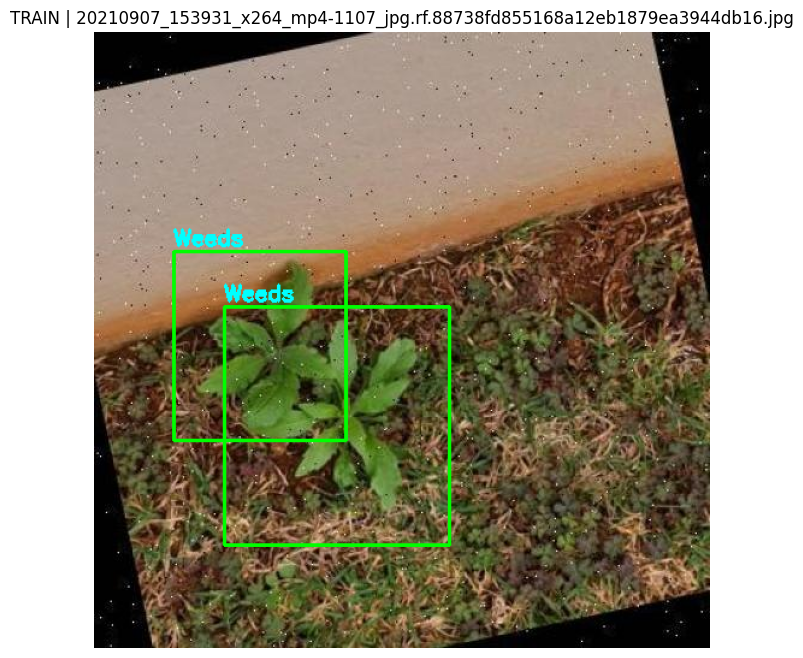

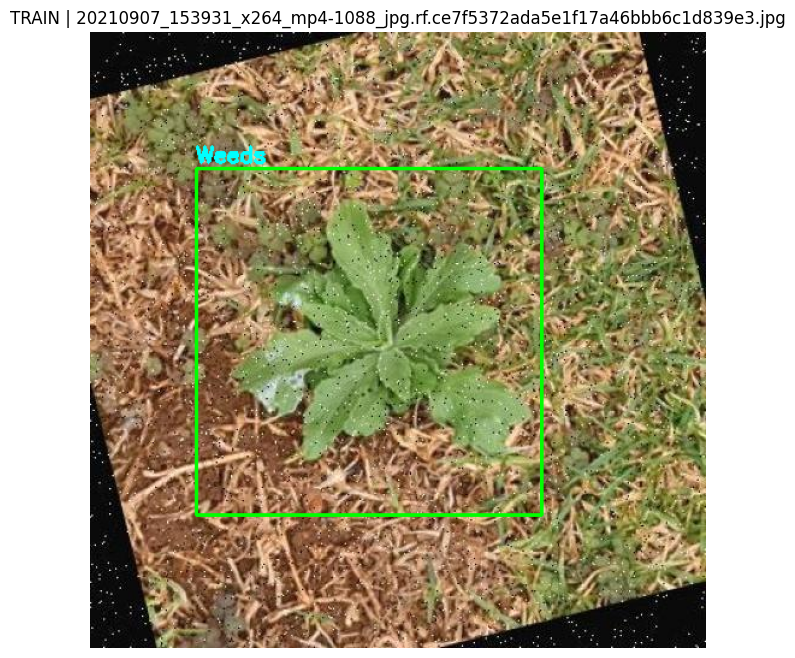

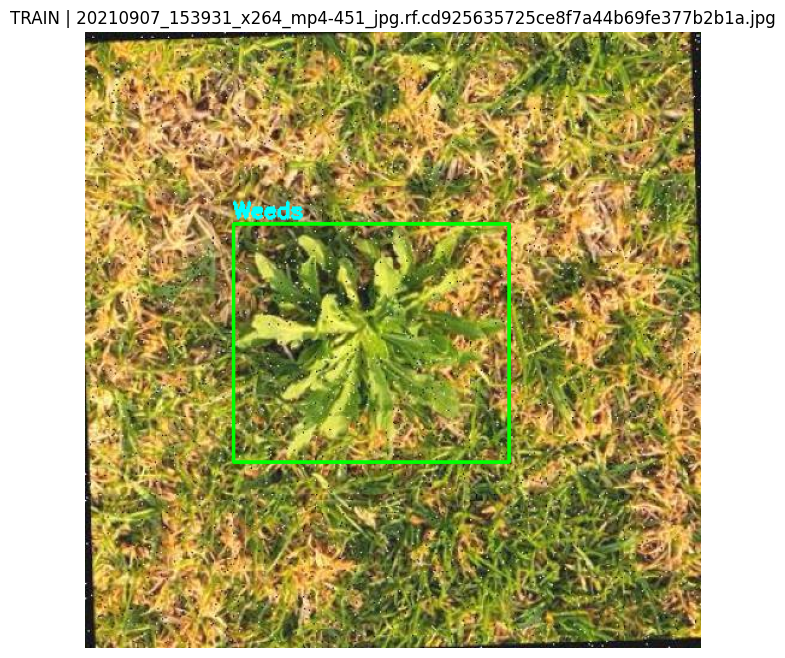

Showing 3 from val


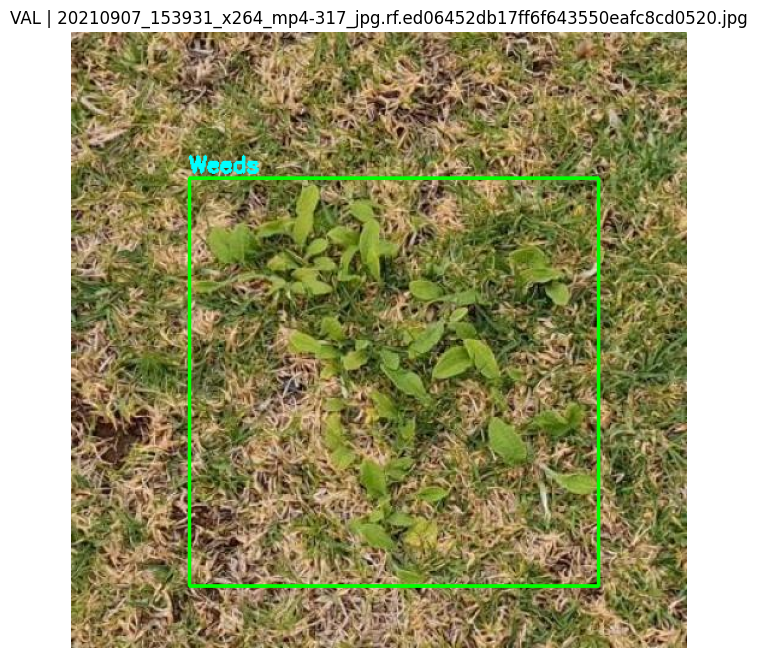

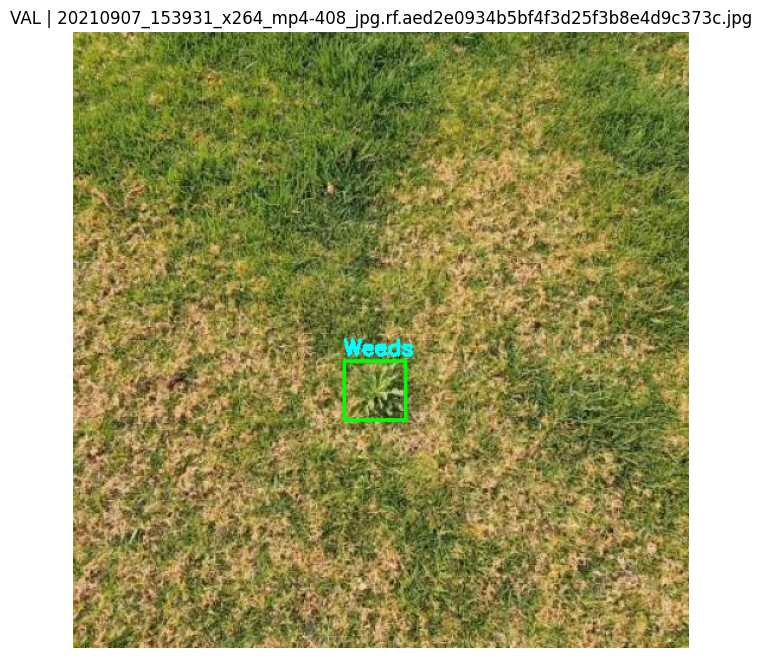

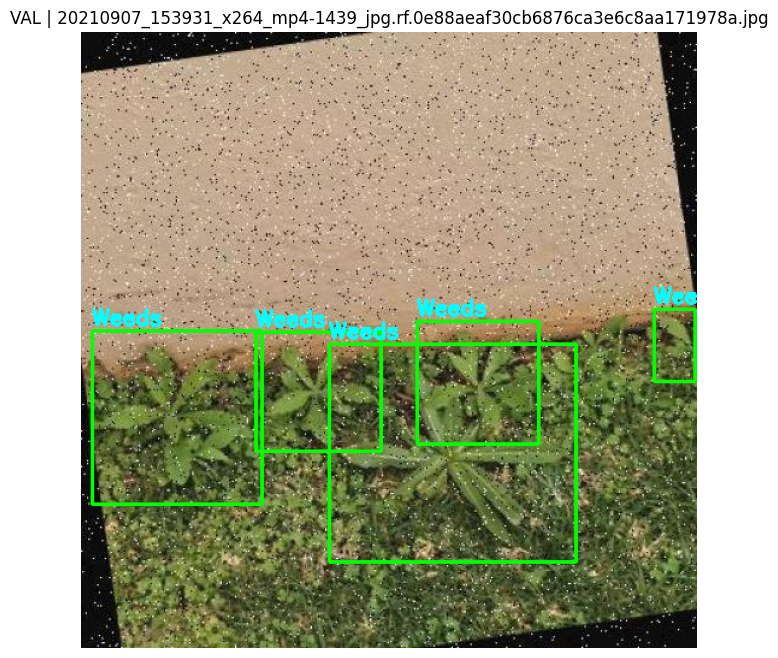

Showing 3 from test


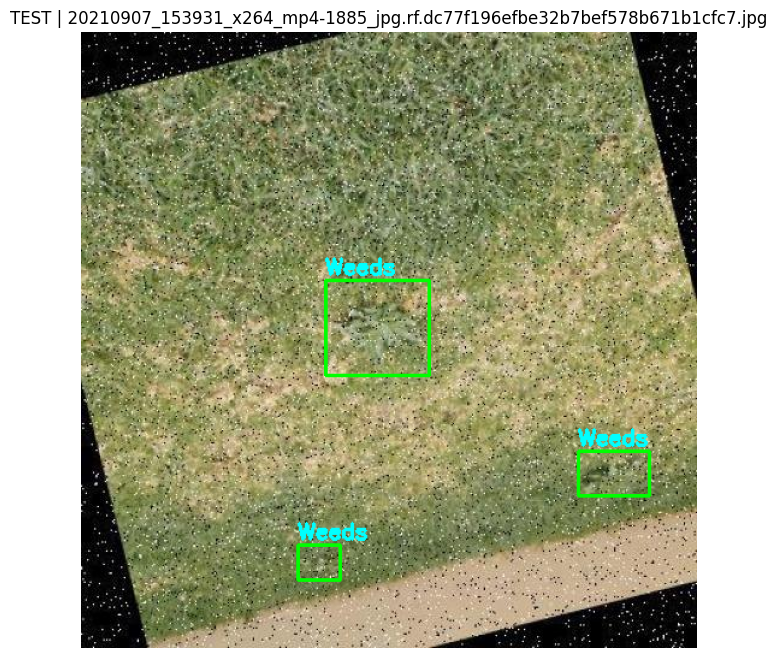

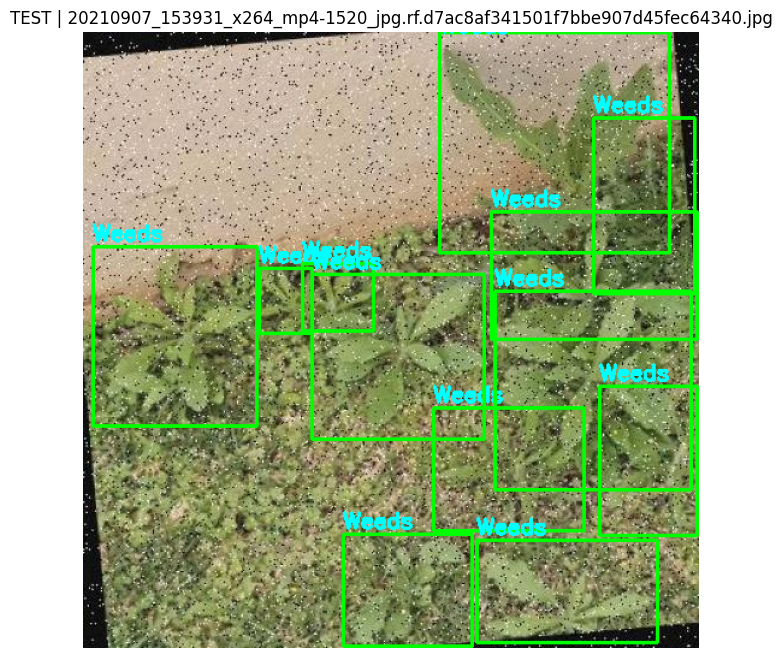

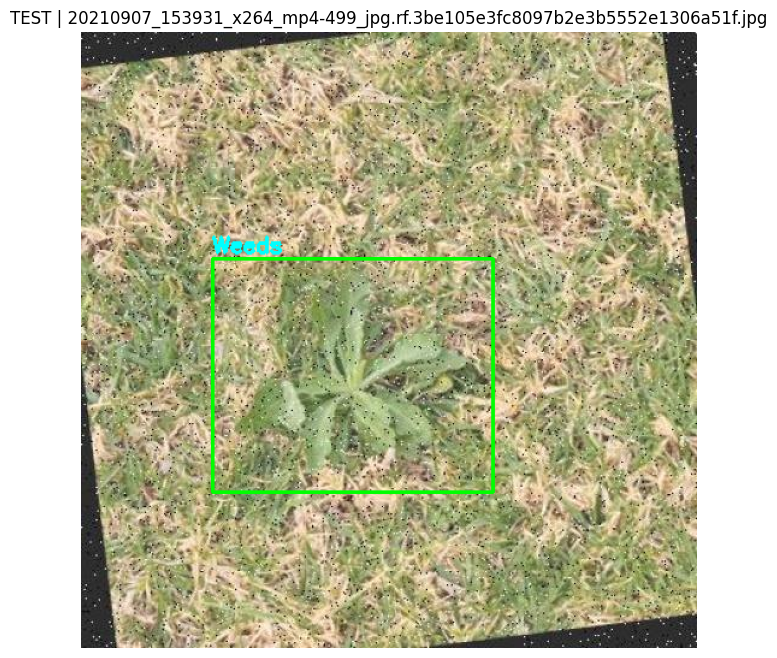

In [5]:
# ============================================================
# Visualize a few labeled samples
# ============================================================
def visualize_yolo_split(split_key: str, num_images: int = 3):
    image_dir = Path(cfg[split_key])
    label_dir = image_dir.parent / "labels"

    img_files = list_images(image_dir)
    if len(img_files) == 0:
        print("No images:", image_dir)
        return

    random.shuffle(img_files)
    img_files = img_files[:num_images]
    print(f"Showing {len(img_files)} from {split_key}")

    for img_path in img_files:
        bgr = cv2.imread(str(img_path))
        if bgr is None:
            continue
        h, w = bgr.shape[:2]

        lbl = label_dir / f"{img_path.stem}.txt"
        if lbl.exists():
            for cls, x, y, bw, bh in read_yolo_labels(lbl):
                x1 = int((x - bw/2) * w); y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w); y2 = int((y + bh/2) * h)
                cv2.rectangle(bgr, (x1,y1), (x2,y2), (0,255,0), 2)
                name = CLASS_NAMES[cls] if cls < len(CLASS_NAMES) else str(cls)
                cv2.putText(bgr, name, (x1, max(0,y1-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,0), 2)

        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        plt.figure()
        plt.imshow(rgb)
        plt.axis("off")
        plt.title(f"{split_key.upper()} | {img_path.name}")
        plt.show()

visualize_yolo_split("train", 3)
visualize_yolo_split("val", 3)
visualize_yolo_split("test", 3)

# 2) Train YOLOv11n

In [6]:
# ============================================================
# Train YOLOv11n (skip if best.pt already exists)
# ============================================================
PROJECT_DIR_V11 = "/kaggle/working/weeds_yolov11_train"
RUN_NAME_V11 = "yolov11_weeds"
BEST_WEIGHT_V11 = f"{PROJECT_DIR_V11}/{RUN_NAME_V11}/weights/best.pt"

if Path(BEST_WEIGHT_V11).exists():
    print("[SKIP] Found existing weights:", BEST_WEIGHT_V11)
else:
    model_v11 = YOLO(MODEL_ID)
    results_v11 = model_v11.train(
        data=str(WORK_YAML),
        epochs=EPOCHS,
        imgsz=IMAGE_SIZE,
        batch=BATCH_SIZE,
        project=PROJECT_DIR_V11,
        name=RUN_NAME_V11,
        device=DEVICE,
        patience=PATIENCE,
        workers=2,
        exist_ok=True,
    )
    print("Training complete.")
    print("Best weights:", BEST_WEIGHT_V11)

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/weeds.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov11_weeds, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=15, perspective=0.0, plot

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        630       1694       0.94      0.958      0.977      0.786
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /kaggle/working/weeds_yolov11_train/yolov11_weeds
Training complete.
Best weights: /kaggle/working/weeds_yolov11_train/yolov11_weeds/weights/best.pt


# 3) Evaluate YOLOv11n (test split)

In [7]:
from pathlib import Path

def evaluate_one_model(model_name: str, weight_path: str):
    weight_path = Path(weight_path)
    if not weight_path.exists():
        raise FileNotFoundError(f"Weights not found: {weight_path}")

    model = YOLO(str(weight_path))
    test_results = model.val(data=str(WORK_YAML), split="test")

    box = test_results.box
    p = box.p
    r = box.r

    precision = float(p.mean()) if hasattr(p, "mean") else float(p)
    recall    = float(r.mean()) if hasattr(r, "mean") else float(r)
    map50     = float(box.map50)
    map5095   = float(box.map)

    f1 = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0.0

    return {
        "Model": model_name,
        "mAP@0.5": map50,
        "mAP@0.5:0.95": map5095,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
    }

metrics_v11 = evaluate_one_model(MODEL_NAME, BEST_WEIGHT_V11)
df_metrics_v11 = pd.DataFrame([metrics_v11])
display(df_metrics_v11)

out_metrics_path = "/kaggle/working/metrics_yolov11.csv"
df_metrics_v11.to_csv(out_metrics_path, index=False)
print("Saved:", out_metrics_path)

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients
val: Fast image access ✅ (ping: 2.8±2.7 ms, read: 8.3±3.4 MB/s, size: 82.8 KB)
val: Scanning /kaggle/input/weeds-dataset/test/labels... 631 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 631/631 145.7it/s 4.3s
WARNING ⚠️ val: Cache directory /kaggle/input/weeds-dataset/test is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 7.4it/s 5.4s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        631       1654      0.963      0.935      0.979      0.782
Speed: 1.1ms preprocess, 2.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/runs/detect/val


,Model,mAP@0.5,mAP@0.5:0.95,Precision,Recall,F1 Score
0,YOLOv11n,0.978625,0.7816,0.962652,0.935009,0.948629


Saved: /kaggle/working/metrics_yolov11.csv


# 4) Training Curves (YOLOv11n)

Looking for: /kaggle/working/weeds_yolov11_train/yolov11_weeds/results.csv


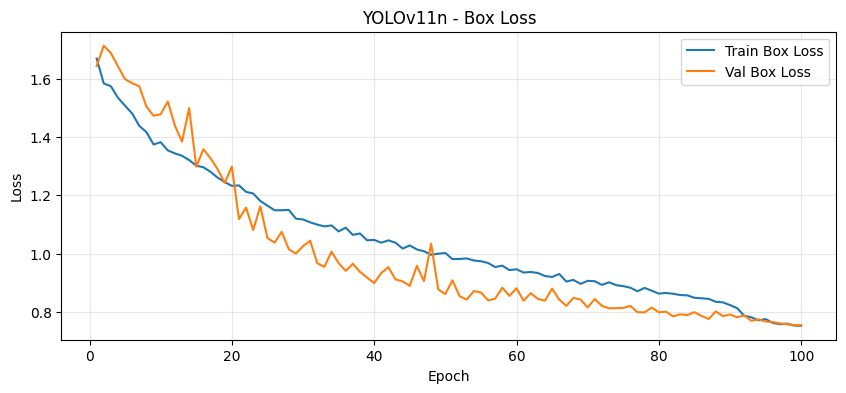

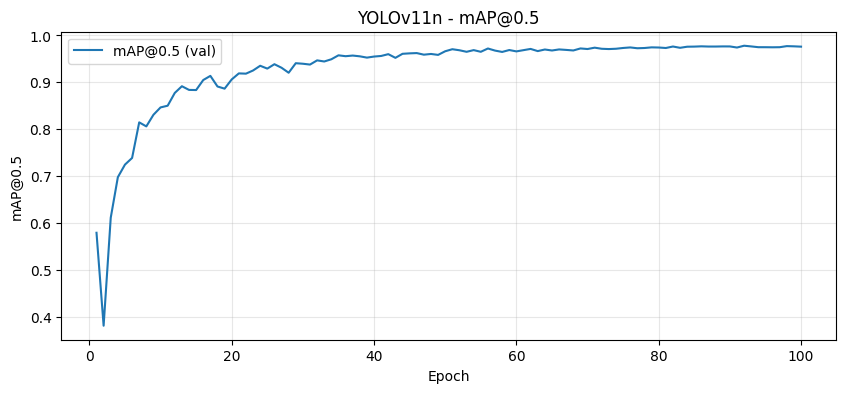

In [8]:
# ============================================================
# Plot training curves from results.csv (if present)
# ============================================================
csv_path = Path(PROJECT_DIR_V11) / RUN_NAME_V11 / "results.csv"
print("Looking for:", csv_path)

if not csv_path.exists():
    print("results.csv not found.")
else:
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()

    # Box loss
    plt.figure(figsize=(10, 4))
    if "train/box_loss" in df.columns:
        plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss")
    if "val/box_loss" in df.columns:
        plt.plot(df["epoch"], df["val/box_loss"], label="Val Box Loss")
    plt.title("YOLOv11n - Box Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss")
    plt.grid(True, alpha=0.3); plt.legend()
    plt.show()

    # mAP50
    plt.figure(figsize=(10, 4))
    if "metrics/mAP50(B)" in df.columns:
        plt.plot(df["epoch"], df["metrics/mAP50(B)"], label="mAP@0.5 (val)")
        plt.title("YOLOv11n - mAP@0.5")
        plt.xlabel("Epoch"); plt.ylabel("mAP@0.5")
        plt.grid(True, alpha=0.3); plt.legend()
        plt.show()
    else:
        print("metrics/mAP50(B) not found in results.csv columns.")

# 5) Qualitative Inference (GT vs Prediction)

In [9]:
# ============================================================
# Draw YOLO-format GT boxes on RGB image
# ============================================================
def draw_gt_on_rgb(rgb_img, label_path: Path, class_names):
    img = rgb_img.copy()
    h, w = img.shape[:2]
    if not label_path.exists():
        return img, 0

    gt_count = 0
    for cls, x, y, bw, bh in read_yolo_labels(label_path):
        x1 = int((x - bw/2) * w); y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w); y2 = int((y + bh/2) * h)
        cv2.rectangle(img, (x1,y1), (x2,y2), (255,0,0), 2)
        name = class_names[cls] if cls < len(class_names) else str(cls)
        cv2.putText(img, name, (x1, max(0,y1-4)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)
        gt_count += 1
    return img, gt_count

Test images: 631


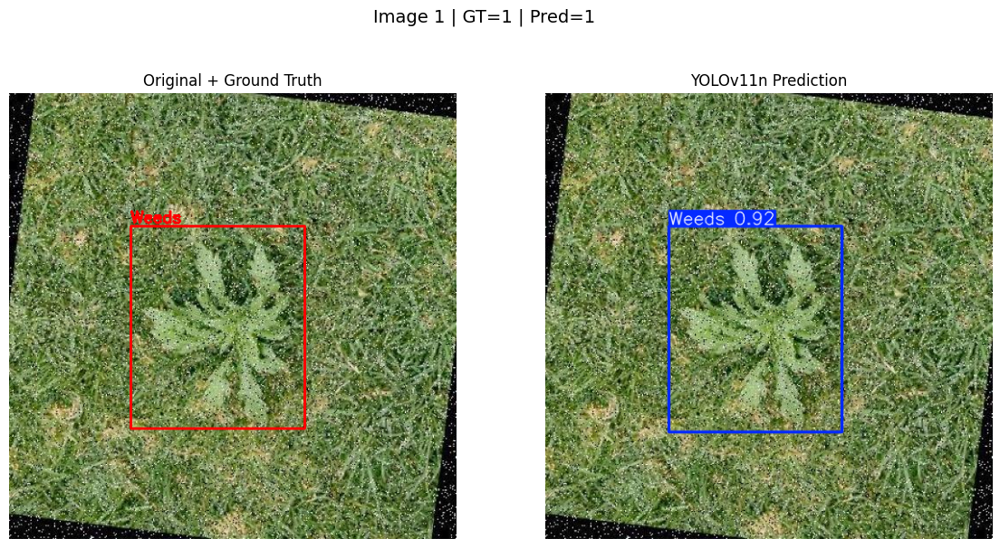

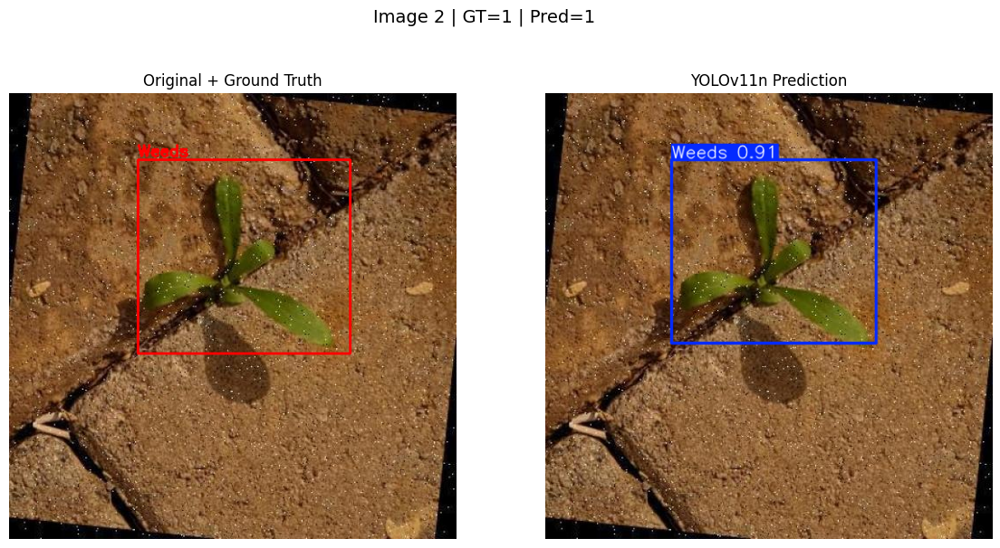

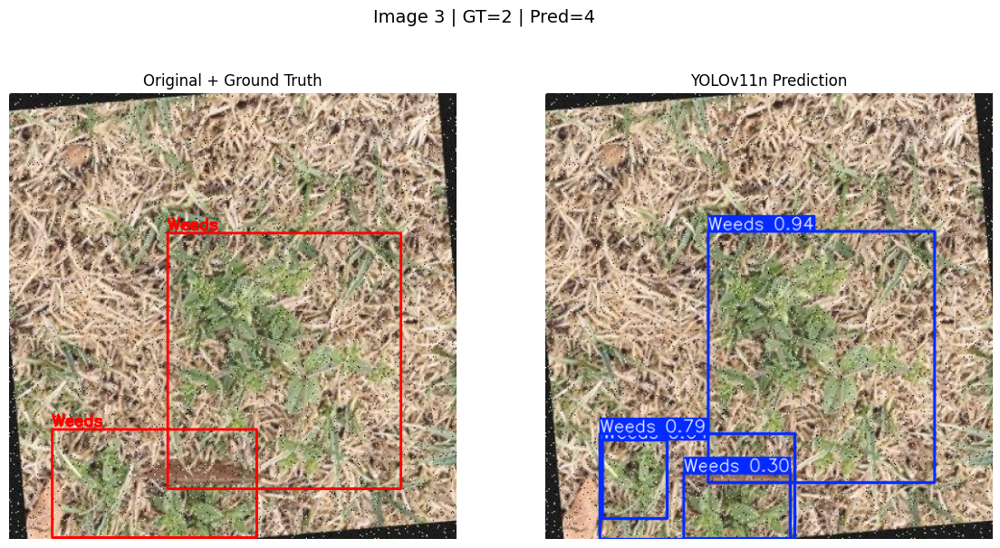

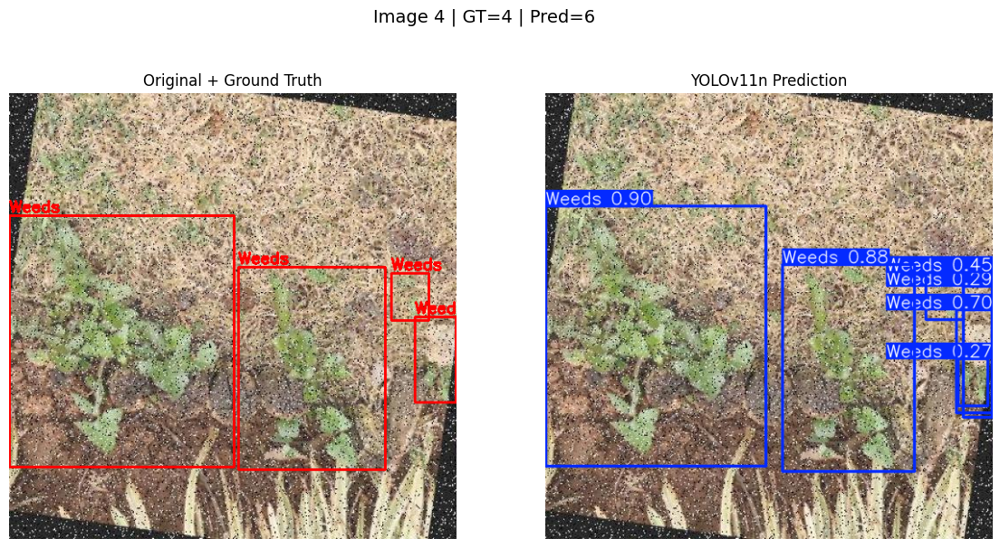

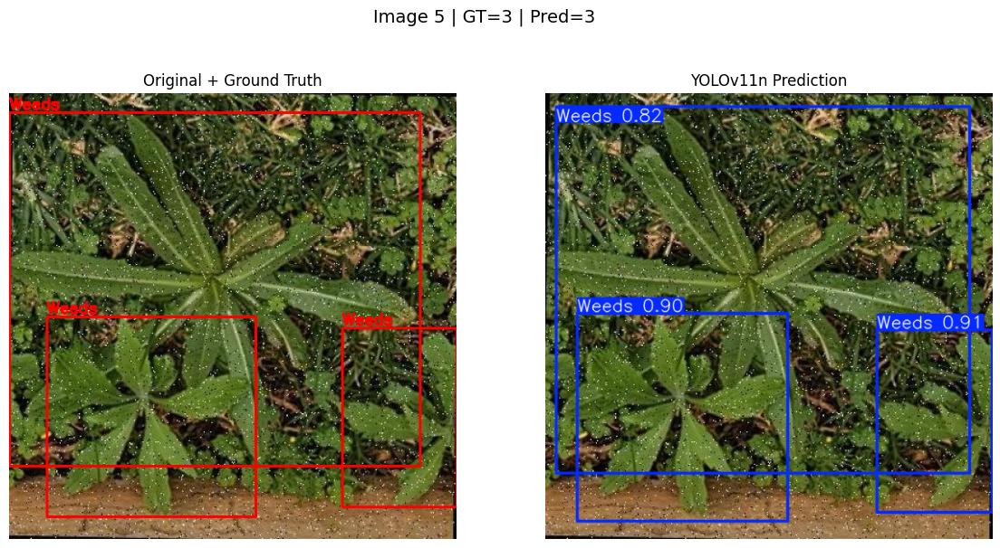

In [10]:
# ============================================================
# Show a few test samples: GT vs YOLOv11n prediction
# ============================================================
CONF_PRED = 0.25
IOU_PRED = 0.7

infer_model = YOLO(BEST_WEIGHT_V11)

test_dir = Path(cfg["test"])
label_dir = test_dir.parent / "labels"

test_imgs = list_images(test_dir)
print("Test images:", len(test_imgs))

for idx, img_path in enumerate(random.sample(test_imgs, k=min(5, len(test_imgs))), start=1):
    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_path = label_dir / f"{img_path.stem}.txt"
    gt_img, gt_count = draw_gt_on_rgb(rgb, gt_path, CLASS_NAMES)

    res = infer_model.predict(bgr, imgsz=IMAGE_SIZE, conf=CONF_PRED, iou=IOU_PRED, device=DEVICE, verbose=False)[0]
    pred_count = int(len(res.boxes)) if res.boxes is not None else 0

    pred_rgb = cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(14, 7))
    plt.suptitle(f"Image {idx} | GT={gt_count} | Pred={pred_count}", fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(gt_img); plt.axis("off"); plt.title("Original + Ground Truth")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_rgb); plt.axis("off"); plt.title("YOLOv11n Prediction")
    plt.show()

# 6) Explainability (ScoreCAM + EigenCAM) + Required Grid Plot

**Grid format**
- **Columns:** Original | ScoreCAM | EigenCAM | Prediction
- **Rows:** model names vertically  

This notebook trains YOLOv11n, but the grid can automatically include other models if their weights exist.

In [11]:
# ============================================================
# CAM utilities (ScoreCAM + EigenCAM)
# ============================================================
def find_last_conv_layer(module: nn.Module) -> nn.Module:
    last = None
    for m in module.modules():
        if isinstance(m, nn.Conv2d):
            last = m
    if last is None:
        raise ValueError("No Conv2d layer found.")
    return last

def normalize01(x: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    x = x.astype(np.float32)
    mn, mx = float(np.min(x)), float(np.max(x))
    if (mx - mn) < eps:
        return np.zeros_like(x, dtype=np.float32)
    return (x - mn) / (mx - mn + eps)

def overlay_heatmap(rgb_uint8: np.ndarray, heat01: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    heat_u8 = np.uint8(np.clip(heat01, 0, 1) * 255)
    heat_bgr = cv2.applyColorMap(heat_u8, cv2.COLORMAP_JET)
    heat_rgb = cv2.cvtColor(heat_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    base = rgb_uint8.astype(np.float32) / 255.0
    out = (1 - alpha) * base + alpha * heat_rgb
    return np.clip(out, 0, 1)

def eigencam_from_activations(acts_chw: np.ndarray) -> np.ndarray:
    C, H, W = acts_chw.shape
    A = acts_chw.reshape(C, -1).T  # (H*W, C)
    A = np.nan_to_num(A)

    _, _, Vt = np.linalg.svd(A, full_matrices=False)
    pc = Vt[0]  # (C,)
    cam = (A @ pc).reshape(H, W)
    cam = np.maximum(cam, 0)
    return normalize01(cam)

def detection_score_sum_conf(yolo: YOLO, img_bgr: np.ndarray, class_id: int = 0,
                             imgsz: int = 640, conf: float = 0.001, iou: float = 0.7, device=0) -> float:
    res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf, iou=iou, device=device, verbose=False)[0]
    if res.boxes is None or len(res.boxes) == 0:
        return 0.0
    cls = res.boxes.cls.detach().cpu().numpy().astype(int)
    confs = res.boxes.conf.detach().cpu().numpy().astype(np.float32)
    confs = confs[cls == int(class_id)] if class_id is not None else confs
    return float(np.sum(confs)) if confs.size else 0.0

def scorecam_from_activations(
    yolo: YOLO,
    base_bgr: np.ndarray,
    acts_chw: np.ndarray,
    class_id: int = 0,
    imgsz: int = 640,
    max_channels: int = 24,
    conf_score: float = 0.001,
    iou_score: float = 0.7,
    device=0,
):
    C, H, W = acts_chw.shape
    flat = acts_chw.reshape(C, -1)
    var = flat.var(axis=1)

    k = int(min(max_channels, C))
    top_idx = np.argsort(-var)[:k]

    base_float = base_bgr.astype(np.float32) / 255.0
    heat = np.zeros((imgsz, imgsz), dtype=np.float32)

    for ch in top_idx:
        amap = acts_chw[ch]
        amap01 = normalize01(amap)
        mask = cv2.resize(amap01, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        mask = np.clip(mask, 0, 1)

        masked = base_float * mask[..., None]
        masked_u8 = np.uint8(np.clip(masked * 255.0, 0, 255))

        s = detection_score_sum_conf(
            yolo=yolo, img_bgr=masked_u8, class_id=class_id,
            imgsz=imgsz, conf=conf_score, iou=iou_score, device=device
        )
        heat += (s * mask.astype(np.float32))

    return normalize01(np.maximum(heat, 0))

def capture_activations_via_hook(
    yolo: YOLO,
    img_bgr: np.ndarray,
    target_layer: nn.Module,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    device=0,
):
    cache = {"acts": None}

    def _hook(_, __, output):
        t = output[0] if isinstance(output, (tuple, list)) else output
        if torch.is_tensor(t):
            cache["acts"] = t.detach().float().cpu()

    h = target_layer.register_forward_hook(_hook)
    try:
        res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf_pred, iou=iou_pred, device=device, verbose=False)
    finally:
        h.remove()

    if cache["acts"] is None:
        raise RuntimeError("No activations captured. Try a different target layer.")
    acts = cache["acts"]
    if acts.dim() == 3:
        acts = acts.unsqueeze(0)
    return res[0], acts[0].numpy()  # (C,H,W)

def plot_xai_grid(
    models: dict,
    img_path: Path,
    class_id: int = 0,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    scorecam_channels: int = 24,
):
    bgr0 = cv2.imread(str(img_path))
    if bgr0 is None:
        raise FileNotFoundError(f"Could not read image: {img_path}")
    base_bgr = cv2.resize(bgr0, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
    base_rgb = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2RGB)

    rows = []
    for row_name, weights in models.items():
        try:
            rows.append((row_name, YOLO(str(weights))))
        except Exception as e:
            print(f"[WARN] Skip {row_name}: {e}")

    if len(rows) == 0:
        raise RuntimeError("No models loaded for grid.")

    n = len(rows)
    fig, axes = plt.subplots(n, 4, figsize=(4 * 4.2, n * 4.2))
    if n == 1:
        axes = axes.reshape(1, 4)

    titles = ["Original", "ScoreCAM", "EigenCAM", "Prediction"]
    for j, t in enumerate(titles):
        axes[0, j].set_title(t, fontsize=13, fontweight="bold")

    for i, (row_name, yolo) in enumerate(rows):
        target_layer = find_last_conv_layer(yolo.model)
        r, acts_chw = capture_activations_via_hook(
            yolo=yolo, img_bgr=base_bgr, target_layer=target_layer,
            imgsz=imgsz, conf_pred=conf_pred, iou_pred=iou_pred, device=DEVICE
        )

        # Original
        axes[i, 0].imshow(base_rgb)
        axes[i, 0].axis("off")
        axes[i, 0].set_ylabel(row_name, fontsize=12, fontweight="bold", rotation=90)

        # ScoreCAM
        sc = scorecam_from_activations(
            yolo=yolo, base_bgr=base_bgr, acts_chw=acts_chw, class_id=class_id,
            imgsz=imgsz, max_channels=scorecam_channels, conf_score=0.001,
            iou_score=iou_pred, device=DEVICE
        )
        axes[i, 1].imshow(overlay_heatmap(base_rgb, sc, alpha=0.45))
        axes[i, 1].axis("off")

        # EigenCAM
        ec_small = eigencam_from_activations(acts_chw)
        ec = cv2.resize(ec_small, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        axes[i, 2].imshow(overlay_heatmap(base_rgb, ec, alpha=0.45))
        axes[i, 2].axis("off")

        # Prediction
        pred_rgb = cv2.cvtColor(r.plot(), cv2.COLOR_BGR2RGB)
        axes[i, 3].imshow(pred_rgb)
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

Sample: 20210907_153931_x264_mp4-199_jpg.rf.6aff0868c88237588dd44068b179ca4f.jpg
[WARN] Skip YOLOv10n: [Errno 2] No such file or directory: '/kaggle/working/weeds_yolov10_train/yolov10_weeds/weights/best.pt'
[WARN] Skip YOLOv12n: [Errno 2] No such file or directory: '/kaggle/working/weeds_yolov12_train/yolov12_weeds/weights/best.pt'


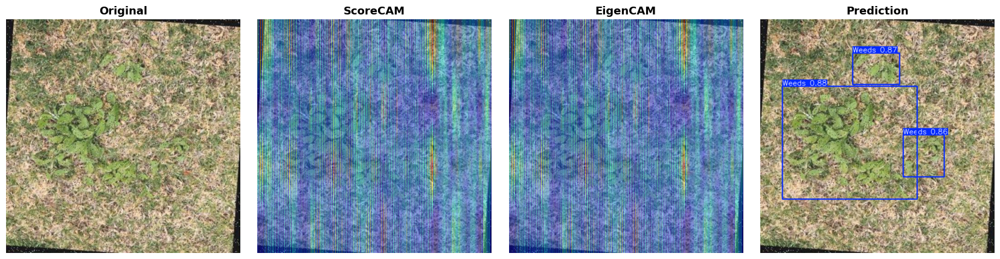

In [12]:
# ============================================================
# Run the required XAI grid on one test image
# ============================================================
test_dir = Path(cfg["test"])
test_imgs = list_images(test_dir)
sample_img = Path(random.choice(test_imgs))
print("Sample:", sample_img.name)

# Rows: auto-include other models if weights exist
MODEL_ZOO = {
    "YOLOv10n": "/kaggle/working/weeds_yolov10_train/yolov10_weeds/weights/best.pt",
    "YOLOv11n": BEST_WEIGHT_V11,
    "YOLOv12n": "/kaggle/working/weeds_yolov12_train/yolov12_weeds/weights/best.pt",
}

# If YOLOv11 weights missing, fall back to pretrained
if not Path(BEST_WEIGHT_V11).exists():
    print("[WARN] YOLOv11 trained weights not found; using pretrained yolo11n.pt")
    MODEL_ZOO["YOLOv11n"] = "yolo11n.pt"

plot_xai_grid(
    models=MODEL_ZOO,
    img_path=sample_img,
    class_id=0,
    imgsz=IMAGE_SIZE,
    conf_pred=0.25,
    iou_pred=0.7,
    scorecam_channels=24,  # reduce to 12 if you need faster runtime
)